## Sequential model for weather forecasting
In this project we explore the using rnn, rnn with gru, seq2seq, seq2seq with attention, and transformer for weather forecasting.

## 0. import packages

In [1]:
import pickle, os, re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

In [2]:
print(torch.cuda.is_available())

True


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## 1. data preparation

In [4]:
data_2015 = pd.read_csv('data/2015.csv')
data_2016 = pd.read_csv('data/2016.csv')
data_2017 = pd.read_csv('data/2017.csv')
data_2018 = pd.read_csv('data/2018.csv')
data_2019 = pd.read_csv('data/2019.csv')
data_2020 = pd.read_csv('data/2020.csv')
data_2021 = pd.read_csv('data/2021.csv')
data_2022 = pd.read_csv('data/2022.csv')

In [5]:
#load date to train, valid and test
train_df = pd.concat([data_2015, data_2016, data_2017, data_2018, data_2019], axis=0, ignore_index=True)
valid_df = pd.concat([data_2020, data_2021], axis=0, ignore_index=True)
test_df = data_2022

In [6]:
#chec the date in df which have more than 3 missising
flab = ['Temp Flag', 'Rel Hum Flag', 'Dew Point Temp Flag', 'Precip. Amount Flag', 'Stn Press Flag', 'Wind Spd Flag']
print("----------------------tain--------------------------")
date_t = set()
for i in flab:
  count1 = train_df[train_df[i] == 'M'].groupby(['Year', 'Month', 'Day'])[i].count()
  count1 = count1[count1 > 3]
  for j in count1.keys():
    date_t.add(j)
print(date_t)
print("----------------------vali--------------------------")
date_v = set()
for i in flab:
  count1 = valid_df[valid_df[i] == 'M'].groupby(['Year', 'Month', 'Day'])[i].count()
  count1 = count1[count1 > 3]
  for j in count1.keys():
    date_v.add(j)
print(date_v)
print("----------------------test--------------------------")
date_s = set()
for i in flab:
  count1 = test_df[test_df[i] == 'M'].groupby(['Year', 'Month', 'Day'])[i].count()
  count1 = count1[count1 > 3]
  for j in count1.keys():
    date_s.add(j)
print(date_s)

----------------------tain--------------------------
{(2019, 6, 5), (2019, 6, 2), (2019, 5, 24), (2015, 12, 10), (2015, 4, 6), (2015, 12, 13), (2015, 12, 7), (2015, 11, 5), (2019, 6, 1), (2019, 6, 4), (2019, 6, 19), (2019, 5, 17), (2015, 12, 6), (2015, 12, 12), (2019, 5, 23), (2015, 12, 9), (2015, 11, 4), (2019, 6, 3), (2019, 6, 18), (2016, 12, 19), (2015, 12, 14)}
----------------------vali--------------------------
{(2021, 7, 21), (2020, 1, 14), (2021, 7, 30), (2021, 7, 20), (2021, 2, 9)}
----------------------test--------------------------
{(2022, 5, 13), (2022, 7, 10), (2022, 7, 13), (2022, 5, 28), (2022, 7, 19), (2022, 5, 22), (2022, 5, 25), (2022, 5, 31), (2022, 5, 12), (2022, 7, 9), (2022, 5, 9), (2022, 7, 6), (2022, 5, 21), (2022, 7, 12), (2022, 5, 24), (2022, 7, 21), (2022, 5, 27), (2022, 7, 18), (2022, 5, 30), (2022, 7, 5), (2022, 5, 11), (2022, 7, 8), (2022, 7, 14), (2022, 5, 20), (2022, 5, 26), (2022, 5, 23), (2022, 7, 20), (2022, 5, 29), (2022, 5, 10), (2022, 7, 7)}


In [7]:
#remove the day which have 3 more missing data in train datafram
for i in date_t:
  train_df = train_df[~((train_df['Year'] == i[0]) & (train_df['Month'] == i[1]) & (train_df['Day'] == i[2]))]
train_df.dropna(how='all')
train_df = train_df.reset_index(drop=True)
#remove the day which have 3 more missing data in valid datafram
for i in date_v:
  valid_df = valid_df[~((valid_df['Year'] == i[0]) & (valid_df['Month'] == i[1]) & (valid_df['Day'] == i[2]))]
valid_df.dropna(how='all')
valid_df = valid_df.reset_index(drop=True)
#remove the day which have 3 more missing data in test datafram
for i in date_s:
  test_df = test_df[~((test_df['Year'] == i[0]) & (test_df['Month'] == i[1]) & (test_df['Day'] == i[2]))]
test_df.dropna(how='all')
test_df = test_df.reset_index(drop=True)

In [8]:
#replace the missing data with the average of last and next hour
flab = ['Temp Flag', 'Dew Point Temp Flag', 'Rel Hum Flag', 'Precip. Amount Flag', 'Wind Spd Flag', 'Stn Press Flag']
vlab = ['Temp (°C)', "Dew Point Temp (°C)", "Rel Hum (%)", "Precip. Amount (mm)", "Wind Spd (km/h)", "Stn Press (kPa)"]
idx = 0
for i in flab:
  rows = train_df.loc[train_df[i] == 'M']
  for index, row in rows.iterrows():
    train_df.loc[index, vlab[idx]] = (
            ((train_df.loc[index - 1, vlab[idx]]) + train_df.loc[index + 1, vlab[idx]]) / 2)
  idx += 1
#replace the missing data in valid set
idx = 0
for i in flab:
  rows = valid_df.loc[valid_df[i] == 'M']
  for index, row in rows.iterrows():
    valid_df.loc[index, vlab[idx]] = (
            ((valid_df.loc[index - 1, vlab[idx]]) + valid_df.loc[index + 1, vlab[idx]]) / 2)
  idx += 1
#replace the missing data in test set
idx = 0
for i in flab:
  rows = test_df.loc[test_df[i] == 'M']
  for index, row in rows.iterrows():
    test_df.loc[index, vlab[idx]] = (
            ((test_df.loc[index - 1, vlab[idx]]) + test_df.loc[index + 1, vlab[idx]]) / 2)
  idx += 1

In [9]:
# chose the train data that need to used
labx = ["Temp (°C)", "Dew Point Temp (°C)", "Rel Hum (%)", "Precip. Amount (mm)", "Wind Spd (km/h)", "Stn Press (kPa)"]
temp = pd.DataFrame(columns=labx)
for j in labx:
  temp[j] = train_df[j]
train_data = temp
# chose the valid data that need to used
temp = pd.DataFrame(columns=labx)
for j in labx:
  temp[j] = valid_df[j]
valid_data = temp
# chose the test data that need to used
temp = pd.DataFrame(columns=labx)
for j in labx:
  temp[j] = test_df[j]
test_data = temp

# drop the row that contain None
train_data = train_data.dropna()
valid_data = valid_data.dropna()
test_data = test_data.dropna()

## 2. Data Summary

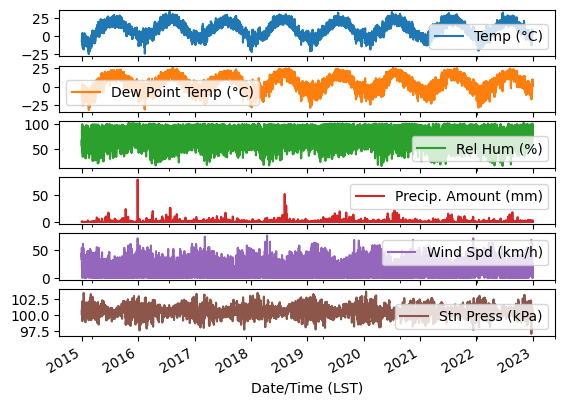

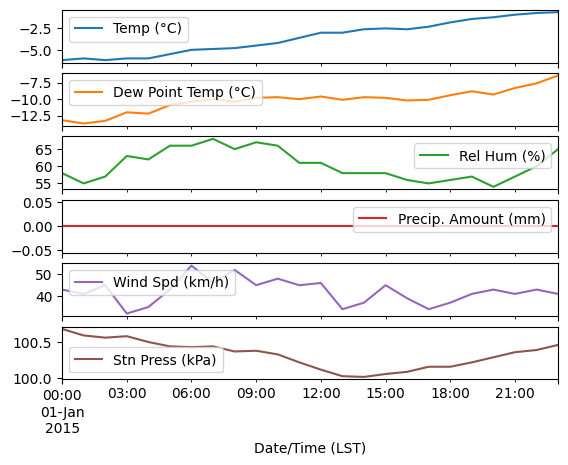

In [10]:
df = pd.concat([train_df, valid_df, test_df], axis=0, ignore_index=True)
date_time = df['Date/Time (LST)']
date_time = pd.to_datetime(date_time, format='%Y/%m/%d %H:%M')
plot_cols = ["Temp (°C)", "Dew Point Temp (°C)", "Rel Hum (%)", "Precip. Amount (mm)", "Wind Spd (km/h)", "Stn Press (kPa)"]
plot_features = df[plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)

plot_features = df[plot_cols][:24]
plot_features.index = date_time[:24]
_ = plot_features.plot(subplots=True)

## 3. Normalization of Trainning, Validation & Test set

In [122]:
# Calculate mean and sd
sample_mean = train_data.mean()
sample_std = train_data.std()

# Normalize
train_data = (train_data - sample_mean) / sample_std
valid_data = (valid_data - sample_mean) / sample_std
test_data = (test_data - sample_mean) / sample_std

temp_mean = sample_mean[0]
temp_std = sample_std[0]

print(sample_mean, temp_mean)
print(sample_std, temp_std)

train_data

Temp (°C)                9.105228
Dew Point Temp (°C)      4.229453
Rel Hum (%)             72.933690
Precip. Amount (mm)      0.088654
Wind Spd (km/h)         17.225652
Stn Press (kPa)        100.730966
dtype: float64 9.105227813865323
Temp (°C)              10.167671
Dew Point Temp (°C)    10.443530
Rel Hum (%)            15.008117
Precip. Amount (mm)     0.768895
Wind Spd (km/h)        10.397769
Stn Press (kPa)         0.790242
dtype: float64 10.167670762759965


,Temp (°C),Dew Point Temp (°C),Rel Hum (%),Precip. Amount (mm),Wind Spd (km/h),Stn Press (kPa)
0,-1.505284,-1.668924,-0.995041,-0.115301,2.478834,-0.064494
1,-1.485613,-1.716800,-1.194933,-0.115301,2.286485,-0.178383
2,-1.505284,-1.678499,-1.061671,-0.115301,2.671183,-0.216346
3,-1.485613,-1.554020,-0.661888,-0.115301,1.420915,-0.191037
4,-1.485613,-1.573170,-0.728518,-0.115301,1.709439,-0.292272
...,...,...,...,...,...,...
43315,-0.826662,-0.759269,-0.062212,-0.115301,2.094137,-1.962646
43316,-0.846332,-0.720968,0.204310,-0.115301,1.228566,-1.912029
43317,-0.836497,-0.749694,0.071049,-0.115301,1.420915,-1.886720
43318,-0.875838,-0.768845,0.137679,-0.115301,1.613264,-1.861411


## 4. Target/Lable Creating

In [123]:
class TimeSeriesDataset(Dataset):
    def __init__(self, data, seq_length, horizon):
        self.seq_length = seq_length
        self.horizon = horizon
        self.features = data.values.astype(np.float32)
        self.labels = data['Temp (°C)'].values.astype(np.float32)

    def __getitem__(self, index):
        features = self.features[index : index + self.seq_length]
        label = self.labels[index + self.seq_length : index + self.seq_length + self.horizon]
        return torch.from_numpy(features), torch.from_numpy(label)

    def __len__(self):
        return len(self.features) - self.seq_length - self.horizon + 1

# Create training and validation and test datasets
seq_length = 168    # Use a history of 168 hours
horizon = 24        # Predict the next 24 hours
train_dataset = TimeSeriesDataset(train_data, seq_length=seq_length, horizon=horizon)
valid_dataset = TimeSeriesDataset(valid_data, seq_length=seq_length, horizon=horizon)
test_dataset = TimeSeriesDataset(test_data, seq_length=seq_length, horizon=horizon)

# Create small data set and loader to overfit model
small_train_dataset = TimeSeriesDataset(train_data[:400], seq_length=seq_length, horizon=horizon)
small_valid_dataset = TimeSeriesDataset(valid_data[:400], seq_length=seq_length, horizon=horizon)

# Create training and validation and test data loaders
batch_size = 64
small_train_loader = DataLoader(small_train_dataset, batch_size=batch_size, shuffle=True) 
small_valid_loader = DataLoader(small_valid_dataset, batch_size=batch_size, shuffle=False)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) 
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [124]:
# shape of the data in training loader
for i, (inputs, targets) in enumerate(train_loader):
    print(f"training set: Inputs shape: {inputs.shape}, Targets shape: {targets.shape}")
    break
# shape of the data in val loader
for i, (inputs, targets) in enumerate(valid_loader):
    print(f"valid set   : Inputs shape: {inputs.shape}, Targets shape: {targets.shape}")
    break
# shape of the data in test loader
for i, (inputs, targets) in enumerate(test_loader):
    print(f"test set    : Inputs shape: {inputs.shape}, Targets shape: {targets.shape}")
    break

training set: Inputs shape: torch.Size([64, 168, 6]), Targets shape: torch.Size([64, 24])
valid set   : Inputs shape: torch.Size([64, 168, 6]), Targets shape: torch.Size([64, 24])
test set    : Inputs shape: torch.Size([64, 168, 6]), Targets shape: torch.Size([64, 24])


## 5.GRU

In [12]:
class GRU(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size):
        super(GRU, self).__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_size).to(x.device)
        out, _ = self.gru(x, h0)
        out = out[:, -1, :]
        out = self.fc(out)
        return out

In [13]:
input_size = 6 # number of input features
hidden_size = 32
num_layers = 1
output_size = 24    #24 Hours

model = GRU(input_size=input_size, hidden_size=hidden_size, num_layers=num_layers, output_size=output_size)

checkpoint_path = "ckpt/"

## 6. Training

In [32]:
def extract_number(file_name):
    """
    Helper function for sorting the files in dir
    """
    match = re.search(r'(\d+)', file_name)
    if match:
        return int(match.group(1))
    else:
        return 0

def get_loss(model, data, criterion, batch_size):
    """
    Helper function for calculating loss
    """
    loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=False)
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            loss = criterion(output, target)
            total_loss += float(loss)
    return total_loss/len(loader)

In [15]:
def train(model, train_data, valid_data, batch_size=512, weight_decay=0.0,
          optimizer="adam", momentum=0.9, learning_rate=0.001, num_epochs=10,
          shuffle_data=True, checkpoint_path=None):
    
    train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=shuffle_data, drop_last=True, pin_memory=True)

    # Loss function
    criterion = nn.MSELoss()

    # Choose Optimizer
    assert optimizer in ("sgd", "adam")
    if optimizer == "sgd":
        optimizer = optim.SGD(model.parameters(),
                              lr=learning_rate,
                              momentum=momentum,
                              weight_decay=weight_decay)
    else:
        optimizer = optim.Adam(model.parameters(),
                               lr=learning_rate,
                               weight_decay=weight_decay)

    iters, losses, train_loss, val_loss, n = [], [], [], [], 0

    # Load weights and previous loss data if exists
    if checkpoint_path != None:
        loss_path = checkpoint_path + "Loss/"
        weight_path = checkpoint_path + "Weight/"

        files = os.listdir(loss_path)
        if len(files) != 0:
            sorted_files = sorted(files, key=extract_number)
            selected_file = sorted_files[-1]
            loss_path += selected_file
            print(sorted_files)

            with open(loss_path, "rb") as file:
                # Deserialize and load the data from the file
                train_loss = pickle.load(file)
                val_loss = pickle.load(file)
                losses = pickle.load(file)
                iters = pickle.load(file)
                n = pickle.load(file)
        
            print(loss_path)
            print(iters, losses, train_loss, val_loss, n)

        files = os.listdir(weight_path)
        if len(files) != 0:
            sorted_files = sorted(files, key=extract_number)
            selected_file = sorted_files[-1]
            weight_path += selected_file
            print(sorted_files)

            model.load_state_dict(torch.load(weight_path))  #load the weight
            print(weight_path)
    

    model = model.to(device)

    print("\n ----- Start Training ----- \n")

    for epoch in range(num_epochs):
        print("Epoch:", epoch)
        for data, target in iter(train_loader):
            data, target = data.to(device, non_blocking=True), target.to(device, non_blocking=True)

            # Start training mode
            model.train()

            output = model(data)
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

            optimizer.zero_grad()
            n += 1

            iters.append(n)
            losses.append(float(loss)/batch_size)
            train_loss.append(get_loss(model, train_data, criterion, batch_size))
            val_loss.append(get_loss(model, valid_data, criterion, batch_size))

        print(f"Training Loss: {train_loss[-1]}")
        print(f"Validation Loss: {val_loss[-1]}")

        #save the hyperparameter
        if (checkpoint_path is not None) and n > 0:
            weight_path = checkpoint_path + f"Weight/WeightData{n}.ckpt"
            torch.save(model.state_dict(), weight_path)
  
            loss_path = checkpoint_path + f"Loss/LossData{n}.pkl"
            with open(loss_path, "wb") as file:
                # Serialize and write the data to the file
                pickle.dump(train_loss, file)
                pickle.dump(val_loss, file)
                pickle.dump(losses, file)
                pickle.dump(iters, file)
                pickle.dump(n, file)
            
            print(weight_path)
            print(loss_path)

        # Plot Graph
        plt.title("Batch Learning Curve")
        plt.plot(iters, losses, label="Train")
        plt.xlabel("Iterations")
        plt.ylabel("Batch Loss")
        plt.show()

        plt.title("Total Learning Curve")
        plt.plot(iters, train_loss, label="Train")
        plt.plot(iters, val_loss, label="Validation")
        plt.xlabel("Iterations")
        plt.ylabel("Loss")
        plt.legend(loc='best')
        plt.show()

        print("Final Training Loss: {}".format(train_loss[-1]))
        print("Final Validation Loss: {}".format(val_loss[-1]))


 ----- Start Training ----- 

Epoch: 0
Training Loss: 2.4758381502968922
Validation Loss: 1.1979310767991203
ckpt/Weight/WeightData6.ckpt
ckpt/Loss/LossData6.pkl


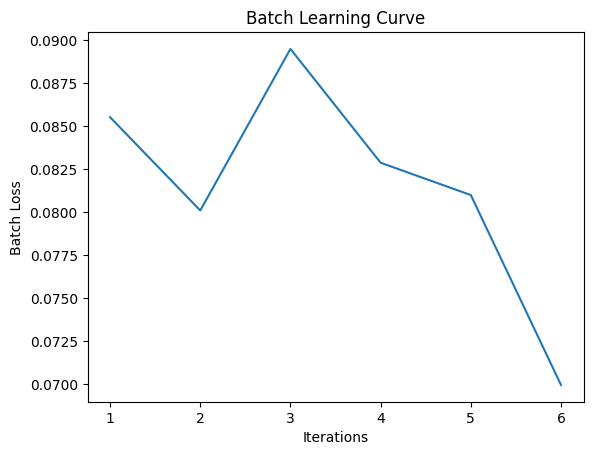

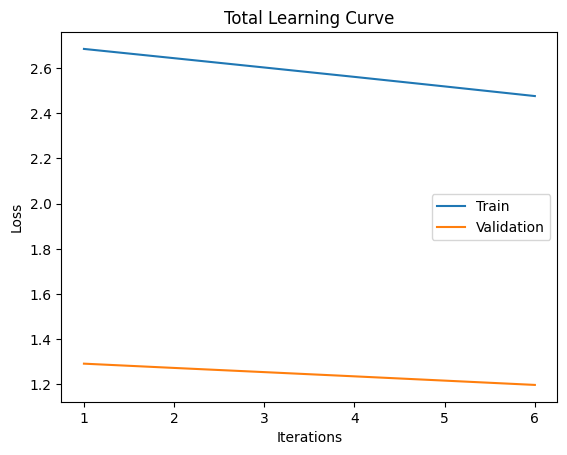

Final Training Loss: 2.4758381502968922
Final Validation Loss: 1.1979310767991203
Epoch: 1
Training Loss: 2.1944472704614912
Validation Loss: 1.0771371658359254
ckpt/Weight/WeightData12.ckpt
ckpt/Loss/LossData12.pkl


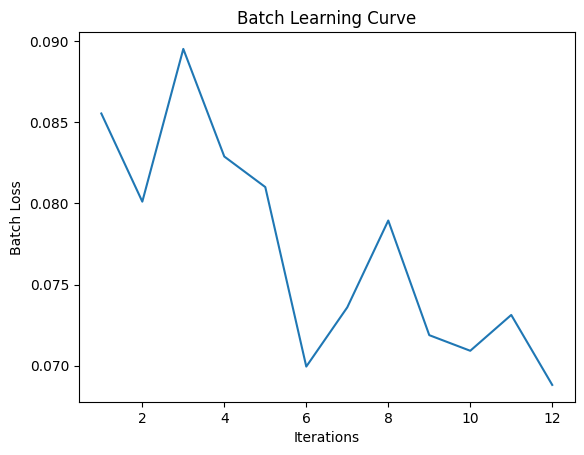

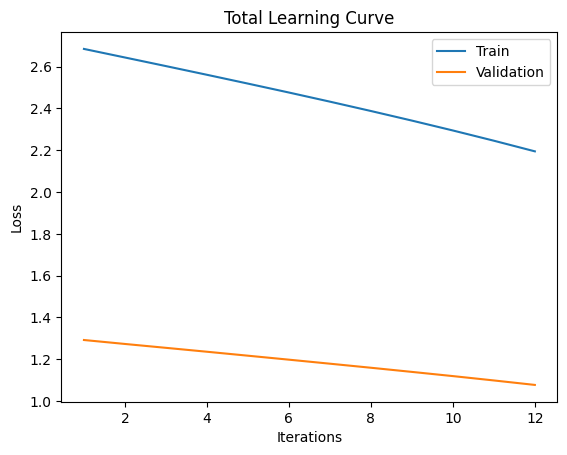

Final Training Loss: 2.1944472704614912
Final Validation Loss: 1.0771371658359254
Epoch: 2
Training Loss: 1.8473302636827742
Validation Loss: 0.9372052890913827
ckpt/Weight/WeightData18.ckpt
ckpt/Loss/LossData18.pkl


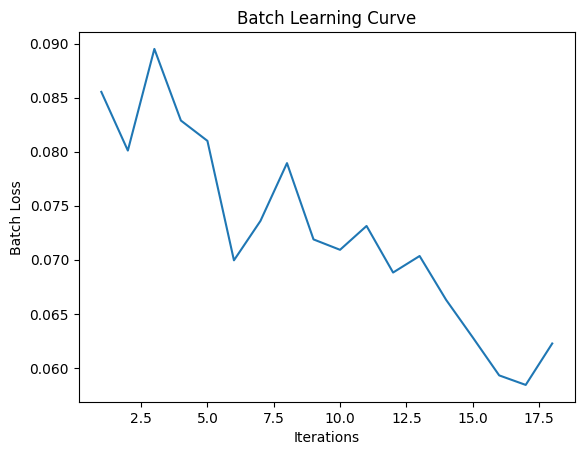

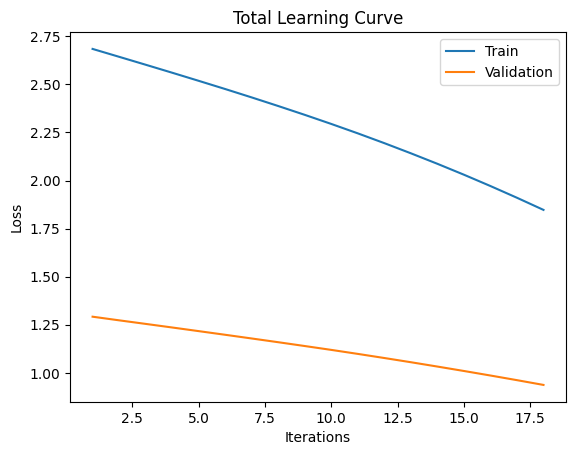

Final Training Loss: 1.8473302636827742
Final Validation Loss: 0.9372052890913827
Epoch: 3
Training Loss: 1.4318692301000868
Validation Loss: 0.7827659430248397
ckpt/Weight/WeightData24.ckpt
ckpt/Loss/LossData24.pkl


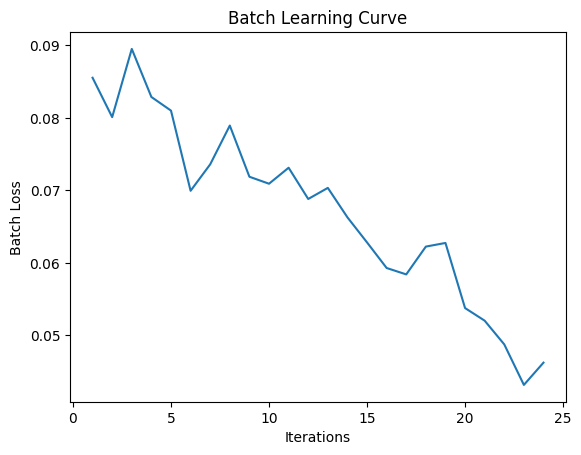

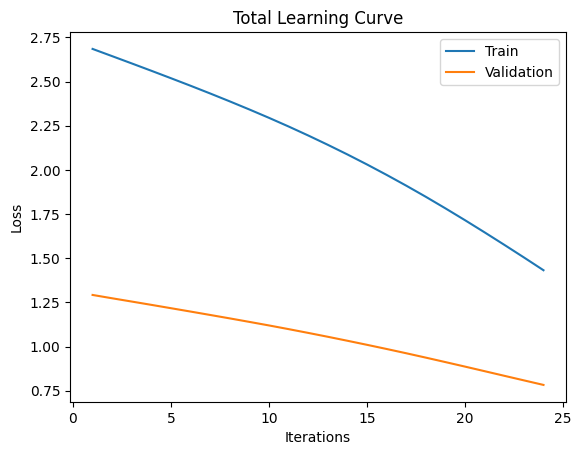

Final Training Loss: 1.4318692301000868
Final Validation Loss: 0.7827659430248397
Epoch: 4
Training Loss: 0.9955657933439527
Validation Loss: 0.6414040923118591
ckpt/Weight/WeightData30.ckpt
ckpt/Loss/LossData30.pkl


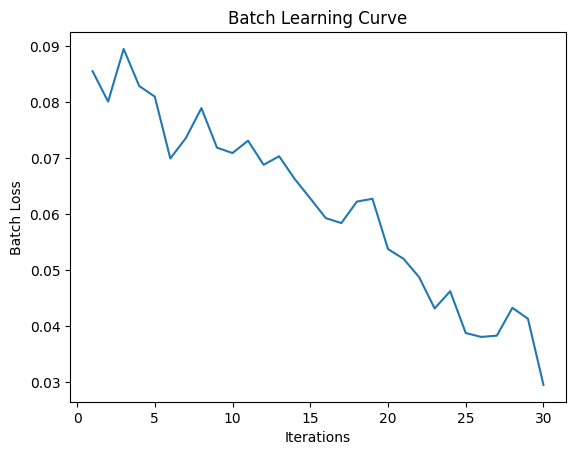

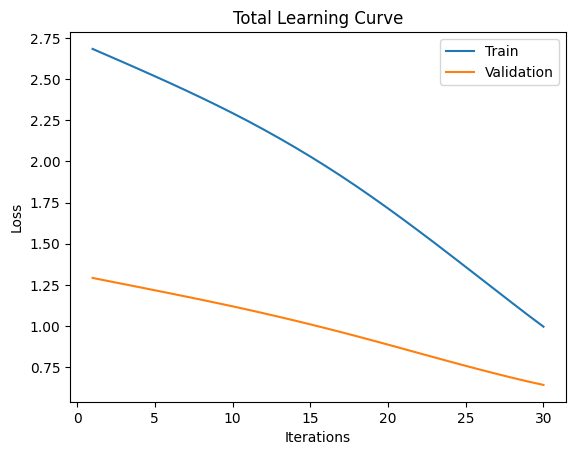

Final Training Loss: 0.9955657933439527
Final Validation Loss: 0.6414040923118591
Epoch: 5
Training Loss: 0.6370953619480133
Validation Loss: 0.5633171402982303
ckpt/Weight/WeightData36.ckpt
ckpt/Loss/LossData36.pkl


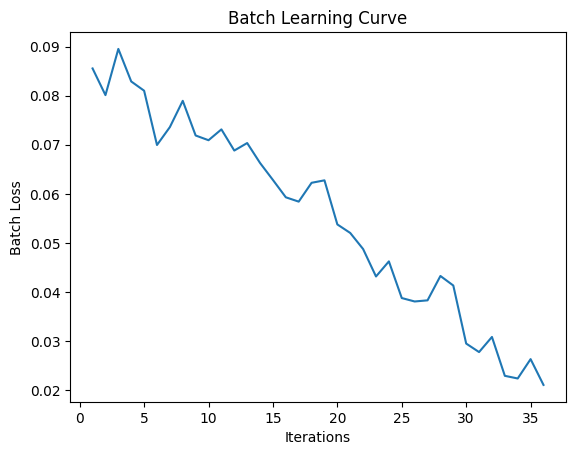

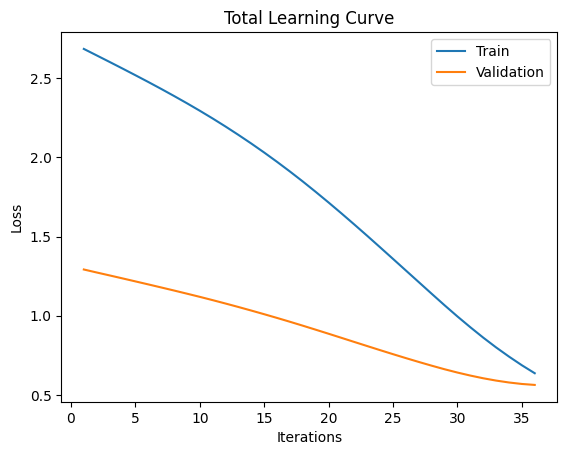

Final Training Loss: 0.6370953619480133
Final Validation Loss: 0.5633171402982303
Epoch: 6
Training Loss: 0.4239822242941175
Validation Loss: 0.5914975787912097
ckpt/Weight/WeightData42.ckpt
ckpt/Loss/LossData42.pkl


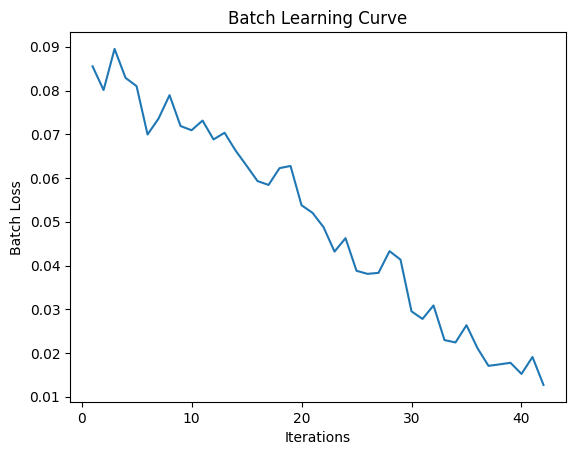

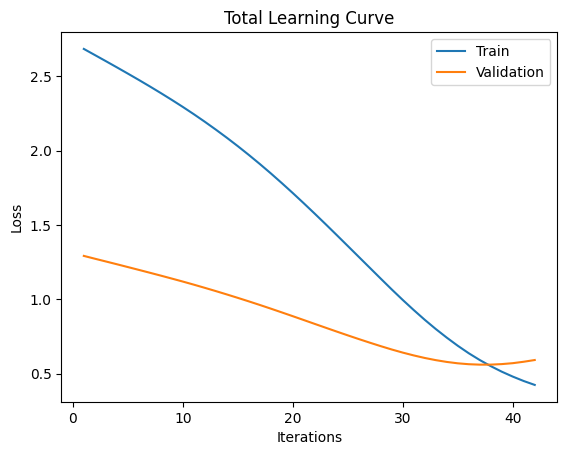

Final Training Loss: 0.4239822242941175
Final Validation Loss: 0.5914975787912097


In [27]:
# Overfit the small tainning set
train(model, small_train_dataset, small_valid_dataset, checkpoint_path=None)

In [28]:
#start train model
train(model,train_dataset, valid_dataset, checkpoint_path=None)


 ----- Start Training ----- 

Epoch: 0


KeyboardInterrupt: 

## 7. Results

In [35]:
# Load Weights
weight_path = checkpoint_path + 'Weight/'
files = os.listdir(weight_path)

if len(files) != 0:
    sorted_files = sorted(files, key=extract_number)
    selected_file = sorted_files[-1]
    weight_path += selected_file
    print(sorted_files)

    model.load_state_dict(torch.load(weight_path))  #load the weight
    print(weight_path)

['WeightData84.ckpt', 'WeightData168.ckpt', 'WeightData252.ckpt', 'WeightData336.ckpt', 'WeightData420.ckpt', 'WeightData504.ckpt', 'WeightData588.ckpt', 'WeightData672.ckpt', 'WeightData756.ckpt', 'WeightData840.ckpt']
ckpt/Weight/WeightData840.ckpt
172.8289269208908


In [125]:
def graph_pred(model, data, batch_size, sample_mean, sample_std):
    predictions = []
    targets = []

    loader = torch.utils.data.DataLoader(data, batch_size=batch_size, shuffle=False)
    model.eval()

    sample_mean_tensor = torch.tensor(sample_mean, device=device)
    sample_std_tensor = torch.tensor(sample_std, device=device)

    with torch.no_grad():
        for data, target in loader:
            data, target = data.to(device), target.to(device)
            output = model(data)

            output = output * sample_std_tensor + sample_mean_tensor
            target = target * sample_std_tensor + sample_mean_tensor

            predictions += output.view(-1).tolist()
            targets += target.view(-1).tolist()

    return predictions, targets

0.05626094573560883


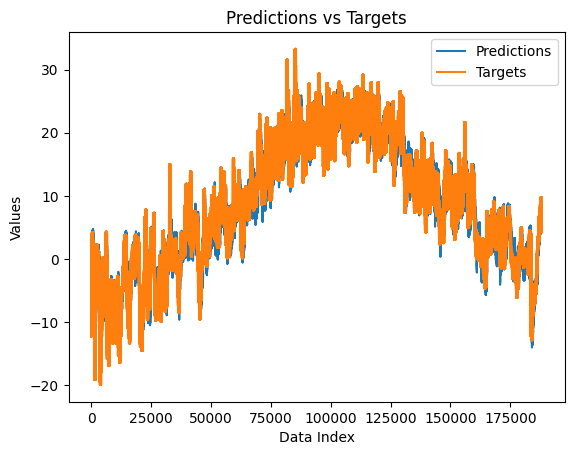

In [138]:
# MSE for Test Set
MSE = get_loss(model=model, data=train_dataset, criterion=nn.MSELoss(), batch_size=512)
print(MSE)

predictions, targets = graph_pred(model=model, data=test_dataset, batch_size=512, sample_mean=temp_mean, sample_std=temp_std)

# Create a range for the x-axis based on the length of the predictions or targets
x = range(len(predictions))

# Plot the predictions and targets on the same graph
plt.plot(x, predictions, label='Predictions')
plt.plot(x, targets, label='Targets')

# Add labels, title, and legend
plt.xlabel('Data Index')
plt.ylabel('Values')
plt.title('Predictions vs Targets')
plt.legend()

# Display the plot
plt.show()

In [139]:
import plotly.graph_objs as go
import plotly.offline as pyo

layout = dict(
    title='Actual Value vs Prediction of Temperature',
    xaxis=dict(title="Hours", ticklen=5, zeroline=False),
    yaxis=dict(title="Temperature", ticklen=5, zeroline=False),
)

target = go.Scatter(
    y=targets,
    mode="lines",
    name="target",
    marker=dict(),
    line=dict(color="rgba(0,0,0, 0.3)"),
)

prediction = go.Scatter(
    y=predictions,
    mode="lines",
    line={"dash": "dot"},
    name='predictions',
    marker=dict(),
    opacity=0.8,
)

fig = dict(data=[target, prediction], layout=layout)
pyo.iplot(fig)